In [ ]:
GOOGLEDRIVE= True
DataPath='breast-cancer-wisconsin.data'
if GOOGLEDRIVE:
  from google.colab import drive
  drive.mount('/content/drive')
  DataPath='drive/MyDrive/Cancer Data/breast-cancer-wisconsin.data'

In [ ]:
!pip install -U ydata-profiling

In [39]:
# prompt: import pandas and pandas-profiling
import pandas as pd
from ydata_profiling import ProfileReport
import pickle

In [40]:
columns = ['sample_number','clump_thickness','uniformity_cell_size','uniformity_cell_shape','marginal_adhersion',
        'single_epithelial_cell_size','bare_nuclei','bland_chromatin','normal_nucleoli','mitoses',
        'class']

In [41]:
df = pd.read_csv(DataPath, names = columns)
df.head()

,sample_number,clump_thickness,uniformity_cell_size,uniformity_cell_shape,marginal_adhersion,single_epithelial_cell_size,bare_nuclei,bland_chromatin,normal_nucleoli,mitoses,class
0,1000025,5,1,1,1,2,1,3,1,1,2
1,1002945,5,4,4,5,7,10,3,2,1,2
2,1015425,3,1,1,1,2,2,3,1,1,2
3,1016277,6,8,8,1,3,4,3,7,1,2
4,1017023,4,1,1,3,2,1,3,1,1,2


In [42]:
ProfileReport(df, explorative=True, title="Breast Cancer Profile" , progress_bar= False)

- *Malgnant and Benign should be balanced*
- *Multi-collinearity*
- *Duplicate rows*

## Cleansing

In [43]:
df_clean = df.copy()
print(df_clean.shape)

(683, 11)


Missing

**No missing data**

Duplicates

In [44]:
df_clean.drop_duplicates(subset=columns[1:], inplace=True)
#=> I want to look for duplicates in subset of my dataframe
#=> inplace=True prevents creating a copy of the df_clean for memory purposes
print(df_clean.shape) #=> size has significally reduced , having duplicates add overfitting

(449, 11)


In [45]:
df_clean.reset_index(drop=True) #=> once it re-index , it will remove the gaps (empty index)
#=> to remove gaps resulting to dropping duplicates or missing values , to avoid any problems in training
df_clean

,sample_number,clump_thickness,uniformity_cell_size,uniformity_cell_shape,marginal_adhersion,single_epithelial_cell_size,bare_nuclei,bland_chromatin,normal_nucleoli,mitoses,class
0,1000025,5,1,1,1,2,1,3,1,1,2
1,1002945,5,4,4,5,7,10,3,2,1,2
2,1015425,3,1,1,1,2,2,3,1,1,2
3,1016277,6,8,8,1,3,4,3,7,1,2
4,1017023,4,1,1,3,2,1,3,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...
677,763235,3,1,1,1,2,1,2,1,2,2
678,776715,3,1,1,1,3,2,1,1,1,2
680,888820,5,10,10,3,7,3,8,10,2,4
681,897471,4,8,6,4,3,4,10,6,1,4


## Model Preparation and Training

In [ ]:
!pip install scikit-learn==1.3.0

In [47]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score , KFold
from sklearn.metrics import confusion_matrix
import numpy as np


In [48]:
input = df_clean.iloc[:,1:10]
# Alt 1 : df_clean.loc[:,'clump_thickness':'mitoses']
# Alt 2 : df_clean.iloc[:,1:-1]
target = df_clean.iloc[:,-1]
# Alt 1 : df_clean.loc[:,'class']

In [49]:
model = LogisticRegression()
results = cross_val_score(model,input,target)
print(f"Accuracy : {np.round(results.mean()*100,1)} % ({np.round(results.std()*100,1)} %)")

Accuracy : 94.9 % (2.6 %)


## Model Tuning

In [50]:
model = LogisticRegression(solver='liblinear')
results = cross_val_score(model,input,target)
print(f"Accuracy : {np.round(results.mean()*100,1)} % ({np.round(results.std()*100,1)} %)")

Accuracy : 94.7 % (2.9 %)


In [51]:
model = LogisticRegression(solver='newton-cg')
results = cross_val_score(model,input,target)
print(f"Accuracy : {np.round(results.mean()*100,1)} % ({np.round(results.std()*100,1)} %)")

Accuracy : 94.9 % (2.6 %)


In [52]:
model = LogisticRegression(solver='sag', max_iter=2000) #=> documented to deal with large datasets
results = cross_val_score(model,input,target)
print(f"Accuracy : {np.round(results.mean()*100,1)} % ({np.round(results.std()*100,1)} %)")

Accuracy : 94.9 % (2.6 %)


In [53]:
n_splits = [3,4,5,10]
random_states = [20,40,60,100]
accuracies = []
split_state = []
for split in n_splits:
  for random_state in random_states:
    model = LogisticRegression(solver='newton-cg')
    kfold = KFold(n_splits=split , shuffle= True ,random_state = random_state) #=> random_state : for unified seed among runners
    results = cross_val_score(model,input,target, cv=kfold)
    acc = (np.round(results.mean()*100,1) , np.round(results.std()*100,1))
    accuracies.append(acc)
    split_state.append((split,random_state))

In [54]:
print(sorted(accuracies, reverse=True)[:3])

[(95.3, 1.6), (95.3, 1.6), (95.1, 2.6)]


In [55]:
max_accuracy = (95.3,1.6)
for i in range(len(accuracies)):
  if accuracies[i] == max_accuracy:
    print(f"accuracy : {accuracies[i]} --> n_splits : {split_state[i][0]} and random_state : {split_state[i][1]}")

accuracy : (95.3, 1.6) --> n_splits : 3 and random_state : 100
accuracy : (95.3, 1.6) --> n_splits : 5 and random_state : 100


In [56]:
x = np.array(input)
y = np.array(target)

In [57]:
model = LogisticRegression(solver='newton-cg')
kfold = KFold(n_splits=5 , shuffle= True ,random_state = 100) #=> random_state : for unified seed among runners
results = cross_val_score(model,input,target, cv=kfold)
model.fit(x,y) #=> training model aside from labels (I don't use feature names)

LogisticRegression(solver='newton-cg')

## Model Deployment

In [58]:
# prompt: save final model to driv

if GOOGLEDRIVE:
  drive.mount('/content/drive')
  print('Model is saved at /content/drive/MyDrive/Final_model.pkl')
  pickle.dump(model,open('/content/drive/MyDrive/Cancer Data/Final_model.pkl','wb'))
  pickle.dump(model,open('Final_model.pkl','wb'))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model is saved at /content/drive/MyDrive/Final_model.pkl


## Generation of some random test cases

In [59]:
# Set a seed for reproducibility
np.random.seed(42)

# Number of samples
num_samples = 3

test = np.zeros((10,9), dtype = int)
high = 3 #upper limit of randint

# Generate random data
for i in range(10):
  if i%4 == 0:
    high = 10
  else:
    high = 3
  data = np.random.randint(1, high, 9)
  test[i] = data

np.random.shuffle(test)

In [60]:
test

array([[2, 1, 2, 1, 1, 1, 1, 1, 2],
       [2, 1, 2, 1, 1, 2, 1, 2, 2],
       [7, 4, 8, 5, 7, 3, 7, 8, 5],
       [2, 2, 2, 2, 2, 1, 1, 2, 2],
       [2, 2, 2, 1, 2, 1, 2, 2, 2],
       [2, 2, 2, 2, 1, 2, 1, 2, 2],
       [3, 7, 4, 9, 3, 5, 3, 7, 5],
       [1, 1, 2, 2, 1, 2, 2, 2, 2],
       [8, 4, 2, 6, 6, 4, 6, 2, 2],
       [1, 2, 1, 2, 2, 2, 1, 2, 1]])

In [61]:
# prompt: let the model predict on the test array we just generated

predictions = model.predict(test)
predictions


array([2, 2, 4, 2, 2, 2, 4, 2, 4, 2])

## Confusion Matrix

1 : Malignant (positive for breast cancer)

0 : Benign

**false positive** : predicted malignant , but it is benign

**false negative** : predicted benign , but it malignant

*Precision* = $\dfrac{TP}{FP + TP}$

*Recall* = $\dfrac{TP}{TP + FN}$

In [62]:
from sklearn.model_selection import train_test_split

mymodel = pickle.load(open('Final_model.pkl','rb'))
x_train , x_test , y_train , y_test = train_test_split(input,target,test_size=0.15,random_state=100)
mymodel.fit(x_train,y_train)
results = mymodel.predict(x_test)

conf_mat = confusion_matrix(y_test,results)
print(confusion_matrix(y_test,results))

#       1    0      <-- predicted

# 1    TP   FN

# 0    FP   TN


true_positive = conf_mat[0,0]
false_positive = conf_mat[1,0]
true_negative = conf_mat[1,1]
false_negative = conf_mat[0,1]

print(f"Precision : {true_positive/(true_positive + false_positive)}")
print(f"Recall : {true_positive/ (true_positive + false_negative)}")
print(f"Accuracy: {(true_positive+true_negative)/(np.sum(conf_mat))}")




[[32  1]
 [ 2 33]]
Precision : 0.9411764705882353
Recall : 0.9696969696969697
Accuracy: 0.9558823529411765


In [63]:
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

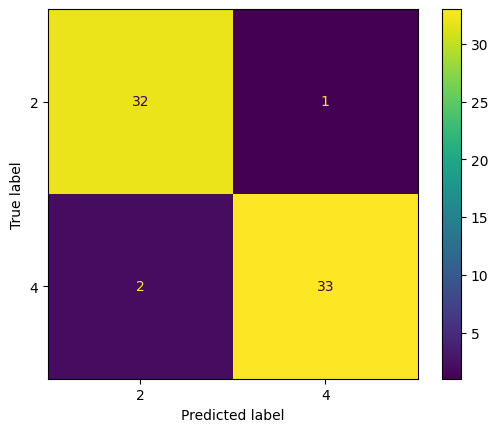

In [64]:
disp = ConfusionMatrixDisplay.from_predictions(y_test,results)
plt.show()

## Creating a Test Harness (This is Generic, Won't work here)

In [65]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import cross_validate
import pandas as pd
import numpy as np

In [66]:
# prompt: suppress any warnings

import warnings
warnings.filterwarnings('ignore')


In [69]:
models = []

models.append(('Logisitc Regression' , LogisticRegression(max_iter=1000)))
models.append(('K nearest neighbour' , KNeighborsClassifier()))
models.append(('RandomForestClassifier' , RandomForestClassifier()))
models.append(('Naive Bayes' , GaussianNB()))
models.append(('SVM' , SVC()))

metrics = ['accuracy']
test_harness_results = pd.DataFrame(columns=['Name','Accuracy','Std. Dev'])
for name , model in models:
  cv_results = cross_validate(model,x_train,y_train,cv=5,scoring=metrics)
  test_harness_results.loc[-1] = [name,cv_results['test_accuracy'].mean(),cv_results['test_accuracy'].std()]
  test_harness_results.index = test_harness_results.index + 1
  test_harness_results = test_harness_results.sort_index()



,Name,Accuracy,Std. Dev
0,SVM,0.958168,0.032129
1,Naive Bayes,0.950273,0.032196
2,RandomForestClassifier,0.955502,0.029157
3,K nearest neighbour,0.968592,0.017521
4,Logisitc Regression,0.944976,0.026511


In [70]:

test_harness_results.sort_values(by='Accuracy',ascending=False)

,Name,Accuracy,Std. Dev
3,K nearest neighbour,0.968592,0.017521
0,SVM,0.958168,0.032129
2,RandomForestClassifier,0.955502,0.029157
1,Naive Bayes,0.950273,0.032196
4,Logisitc Regression,0.944976,0.026511
